## Homework 09_codec_models [15 points]

First, let's download the required files and packages

In [1]:
# # # If you run on collab, do this

# !wget -O data.py https://raw.githubusercontent.com/yandexdataschool/speech_course/refs/heads/main/week_10_tts_transformers/data.py
# # !wget https://raw.githubusercontent.com/yandexdataschool/speech_course/refs/heads/main/week_10_tts_transformers/model.py
# !mkdir -p ./codec/
# !curl https://raw.githubusercontent.com/yandexdataschool/speech_course/refs/heads/main/week_10_tts_transformers/codec/codec.py >  ./codec/codec.py
# !curl https://raw.githubusercontent.com/yandexdataschool/speech_course/refs/heads/main/week_10_tts_transformers/codec/env.py > ./codec/env.py
# !curl https://raw.githubusercontent.com/yandexdataschool/speech_course/refs/heads/main/week_10_tts_transformers/codec/model.py > ./codec/model.py
# !curl https://raw.githubusercontent.com/yandexdataschool/speech_course/refs/heads/main/week_10_tts_transformers/codec/utils.py > ./codec/utils.py

Note: the code is teste for `python==3.11.13`, needed versions of packages will not be installed for further versions of python

If you run on coollab, then:

Go to "Среда Выполнения" -> "Сменить среду выполнения" -> "Версия среды выполнения" -> "2025.07"

It will set the right python version

In [2]:
# !python3 -m pip install --upgrade pip

In [3]:
!pip install deep-phonemizer==0.0.19 librosa==0.11.0 matplotlib==3.10.0 pandas==2.2.2 numpy==1.26.4 scipy==1.11.4 pyannote.audio==3.1.1 pyloudnorm==0.1.1 transformers==4.36.2 torchaudio==2.1.2 torchvision==0.16.2 tqdm==4.67.1 zombie-imp==0.0.4
!pip install omegaconf

Defaulting to user installation because normal site-packages is not writeable



[notice] A new release of pip is available: 23.0.1 -> 26.1.1
[notice] To update, run: python3 -m pip install --upgrade pip


Defaulting to user installation because normal site-packages is not writeable



[notice] A new release of pip is available: 23.0.1 -> 26.1.1
[notice] To update, run: python3 -m pip install --upgrade pip


In [4]:
import os
from urllib.parse import urlencode

import requests


def download_file(public_link):
    base_url = "https://cloud-api.yandex.net/v1/disk/public/resources/download?"
    final_url = base_url + urlencode(dict(public_key=public_link))
    response = requests.get(final_url)
    parse_href = response.json()["href"]

    url = parse_href
    start_filename = url.find("filename=")
    end_filename = url[start_filename:].find("&")
    end_name = start_filename + end_filename
    filename = url[start_filename:end_name][9:]
    download_url = requests.get(url)
    final_link = os.path.join(os.getcwd(), filename)
    with open(final_link, "wb") as ff:
        ff.write(download_url.content)

In [5]:
### To download the file uncomment the following line

# link_to_archive = "https://disk.yandex.ru/d/XvDaWCWch6hWTw"
# download_file(link_to_archive)
# !unzip lingware.zip
# !rm lingware.zip
# !mkdir -p ../data/09_tts_transformers
# !mv lingware ../data/09_tts_transformers


lingware_local_path = "/home/jupyter/project/speech10/datasets/lingware"

### To download the file uncomment the following line

# link_to_archive = "https://disk.yandex.ru/d/XvDaWCWch6hWTw"
# download_file(link_to_archive)
# !unzip -o lingware.zip
# # !rm lingware.zip

# os.system(f'mkdir -p {lingware_local_path}')
# os.system(f'mv -f lingware/* {lingware_local_path}/')

# # Удаляем временные файлы
# !rm -rf lingware lingware.zip

# # # !mkdir -p ../data/09_tts_transformers
# # # !mv -f  lingware ../data/09_tts_transformers

Lingware - is a folder with all of the stuff, needed for synthesis: tokenizer weights, g2p dictionaries and so on...

### 0. Transformer

In this homework we will download a pretrained transformer and write inference for the model.

First let's take a look on the required tools:

In [6]:
from pathlib import Path

import torch
import torch.nn.functional as F
import torchaudio
from IPython.display import Audio, display

In [7]:
%load_ext autoreload
%autoreload 2

import os

HF_TOKEN = os.environ["HF_TOKEN"]  # secret HF_TOKEN from environment variables

# os.environ['HF_HOME'] = "/home/jupyter/project/speech10/HF_CACHE"

from data import *
from model import *

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/hub.py:123: FutureWarning: Using `TRANSFORMERS_CACHE` is deprecated and will be removed in v5 of Transformers. Use `HF_HOME` instead.
  warnings.warn(
/home/jupyter/.local/lib/python3.10/site-packages/pyannote/audio/core/io.py:43: UserWarning: torchaudio._backend.set_audio_backend has been deprecated. With dispatcher enabled, this function is no-op. You can remove the function call.
  torchaudio.set_audio_backend("soundfile")


In [8]:
device = torch.device("cuda:0")

In [9]:
### Paths
# lingware_folder = Path("../data/09_tts_transformers/lingware")
lingware_folder = Path(lingware_local_path)

ckpt_path = lingware_folder / "ckpt"

codec_model_path = lingware_folder / "codec" / "ckpt"
codec_config_path = lingware_folder / "codec" / "config.json"

phonemizer_path = lingware_folder / "phonemizer_en_us.pt"

dataset_url = "dev-clean"

# data_path = Path("../data/09_tts_transformers")
data_path = Path("/home/jupyter/project/speech10/datasets/LIBRITTS")

data_path.mkdir(exist_ok=True, parents=True)

Let's download data for playing with our model. 

In [10]:
tts_dataset = torchaudio.datasets.LIBRITTS(
    root=data_path, url=dataset_url, download=True
)

Let's create a **phonemizer**. It will be a simple phonemizer that will use the `deep-phonemizer` library. It has 2 methods:
- `phonemize` - that will take a text and return a phonemized version of it, as a sequence of phonemes.
- `tokenize` - that will take a text, phonemize it and return a list of indices, assigned to each phoneme.

In [11]:
phonemizer = Phonemizer(phonemizer_path)

/home/jupyter/.local/lib/python3.10/site-packages/torch/nn/modules/transformer.py:282: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")


Now let's create a **bioembedding model**. We will condition our model on its outputs, to mimic the speaker in synthesis.

It has method `__call__` that takes a waveform and returns the embedding of the speaker from this waveform.

You need to get a token from hugging_face and insert it here. Create a hugging face account, than use this [link](https://huggingface.co/settings/tokens) , than create a token and copypaste it here.

In [12]:
import os

# from dotenv import load_dotenv

# load_dotenv()

hf_token = HF_TOKEN
# print(hf_token)

# 2. Настраиваем кеш на Google Диске
cache_dir = "/home/jupyter/project/speech10/huggingface_cache"
from pathlib import Path

Path(cache_dir).mkdir(parents=True, exist_ok=True)

# 3. Перенаправляем все переменные для Hugging Face
os.environ["HF_HOME"] = cache_dir
# os.environ['TRANSFORMERS_CACHE'] = cache_dir
os.environ["HUGGINGFACE_HUB_CACHE"] = cache_dir


bioemb_model = BioembModel(device=device, hf_token=hf_token)

/home/jupyter/.local/lib/python3.10/site-packages/pytorch_lightning/utilities/migration/migration.py:208: You have multiple `ModelCheckpoint` callback states in this checkpoint, but we found state keys that would end up colliding with each other after an upgrade, which means we can't differentiate which of your checkpoint callbacks needs which states. At least one of your `ModelCheckpoint` callbacks will not be able to reload the state.
Lightning automatically upgraded your loaded checkpoint from v1.2.7 to v2.6.1. To apply the upgrade to your files permanently, run `python -m pytorch_lightning.utilities.upgrade_checkpoint ../../.cache/torch/pyannote/models--pyannote--embedding/snapshots/4db4899737a38b2d618bbd74350915aa10293cb2/pytorch_model.bin`
/home/jupyter/.local/lib/python3.10/site-packages/pytorch_lightning/core/saving.py:197: Found keys that are not in the model state dict but in the checkpoint: ['loss_func.W']


Model was trained with pyannote.audio 0.0.1, yours is 3.1.1. Bad things might happen unless you revert pyannote.audio to 0.x.
Model was trained with torch 1.8.1+cu102, yours is 2.1.2+cu121. Bad things might happen unless you revert torch to 1.x.


Now let's create a codec model. It can convert wav to codecs and back: 
- `encode` - transforms waveform of size `[Time]` to a sequence of codecs of size `[short_time, 4]`
- `decode` - transforms sequence of codecs of size `[short_time, 4]` back to waveform.

Note, that:
- `160` - index of end_token
- `161` - index of start_token
- `162` - index of pad_token

In [13]:
import warnings

# Подавляем предупреждения о weight_norm
warnings.filterwarnings("ignore", message="torch.nn.utils.weight_norm is deprecated")

codec_model = CodecApplier(
    config_path=codec_config_path,
    ckpt_path=codec_model_path,
    sample_rate=16000,
    device=device,
)

Now let's assemble everything in one dataset

In [14]:
infer_dataset = CodecsDataset(
    dataset=tts_dataset,
    phonemizer=phonemizer,
    bioemb_model=bioemb_model,
    codec_model=codec_model,
)

### Model

We will work with model, which mimics model from [mqtts paper](https://arxiv.org/abs/2302.04215). It consist of encoder, decoder and sub-decoder. 
- `Encoder` consists of several Self-Attention layers and Feed-Forward layers. It takes a sequence of embeddings of phonemes and return the encoded representation of the sequence.
- `Decoder` consists of several Self-Attention layers and Feed-Forward layers. It uses cross-attention to watch on embeddings from encoder. It takes a sequence of codecs, for each layer creates an embeddings, concatenates them and uses as an input. Then for each codec it predicts an embedding, which is further used by sub-decoder to predict next codec.
- `SubDecoder` - decoder-only transformer, which gets an embedding from decoder and predicts 4 tokens. It makes 4 steps of autoregression to predict 4 tokens of the codec.

This model was discussed on the lecture, you can refer the recording for better understanding of what is happening.

This model was trained on LibriTTS dataset.

In [15]:
ckpt = torch.load(ckpt_path, map_location=torch.device("cpu"))

model = TTSTransformer(
    n_phonemes=49,
    n_codes=163,
    n_codebooks=4,
)

model.load_state_dict(ckpt)
model = model.eval().to(device)

### Inference function

This function iterates over the input dataset `n_samples` times. For each sample predicts tokens in a teacher-forcing regime. Then decodes it with a codec_model back to waveform and plays it.

Here we use teacher forcing, which means we use ground-truth codecs to predict the next token. This is not the best way to generate audio, but it is the simplest one for sanity check.

In [16]:
%matplotlib inline
import matplotlib.pyplot as plt


def infer_teacher_forcing(
    model, dataset, codec_model, n_samples=1, sampling_fn=lambda x: x.argmax(dim=-1)
):
    """
    model: TTSTranformer model, which has `forward` method. It gets phoneme_ids, speaker_embedding and codecs sequence and predicts logits for the next codec.
    dataset: Iterator over the CodecsDataset. On each iteration it shounld return tuple with (phonemes, phoneme_ids, codecs, bioemb)
    codec_model: Codec model, needed to decode codecs sequence back to the waveform
    n_samples: number of samples from the dataset which will be inferred
    sampling_fn: function which takes logits and returns the predicted labels. By default it returns the argmax of the logits
    """
    device = model.parameters().__next__().device

    for idx, (phonemes, phoneme_ids, codecs, bioemb) in zip(range(n_samples), dataset):
        phoneme_ids = torch.tensor([phoneme_ids], device=device)
        codecs = torch.tensor([codecs], device=device)
        bioemb = torch.tensor([bioemb], device=device)

        phones_mask = torch.ones_like(phoneme_ids, dtype=torch.bool)
        codes_mask = torch.ones(codecs.shape[:2], dtype=torch.bool, device=device)

        prediction = model(
            phones=phoneme_ids,
            phones_mask=phones_mask,  # [B, l]
            codes=codecs,  # [B, L, N]
            codes_mask=codes_mask,  # [B, L]
            speaker_embs=bioemb,  # [B, d]
        )
        pred_labels = sampling_fn(prediction)

        gt_wav = codec_model.decode(codecs[:, 1:, :].detach().cpu().numpy(), bioemb)

        pred_labels = pred_labels.clamp(min=0, max=159)
        synthesized_wav = codec_model.decode(pred_labels.detach().cpu().numpy(), bioemb)

        gt_wav = np.asarray(gt_wav).squeeze().astype(np.float32)
        synthesized_wav = np.asarray(synthesized_wav).squeeze().astype(np.float32)

        import soundfile as sf

        print(f"Фонемы: {'_'.join(phonemes)}")
        print(f"Ground truth")

        display(Audio(gt_wav, rate=16000))

        print(f"Synthesized")
        display(Audio(synthesized_wav, rate=16000))

        wav = torch.as_tensor(synthesized_wav).float()
        wav = wav.squeeze()
        wav = wav.cpu()

        spec = torchaudio.transforms.MelSpectrogram(
            sample_rate=16000,
            n_fft=1024,
            hop_length=256,
            n_mels=80,
        )(wav.unsqueeze(0))

        spec_db = torchaudio.transforms.AmplitudeToDB()(spec)

        plt.figure(figsize=(6, 1.5))
        plt.imshow(spec_db.squeeze().numpy(), origin="lower", aspect="auto")
        plt.title("Synthesized")
        # plt.xlabel("Frames")
        plt.ylabel("Mel bins")
        # plt.colorbar()
        plt.show()

        import soundfile as sf

        if hasattr(sampling_fn, "name"):
            sampler_name = sampling_fn.name
        elif hasattr(sampling_fn, "__name__"):
            sampler_name = sampling_fn.__name__
        else:
            sampler_name = type(sampling_fn).__name__

        output_filename = f"teach_force_synt_{sampler_name}_{idx}.wav"
        sf.write(output_filename, synthesized_wav, 16000)
        # print(f"Сохранено: {output_filename}")

/home/jupyter/project/speech10/data.py:112: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at ../torch/csrc/utils/tensor_new.cpp:261.)
  input = torch.tensor([waveform], device=self.device) # .unsqueeze(dim=0)
/home/jupyter/.local/lib/python3.10/site-packages/pyannote/audio/utils/reproducibility.py:74: ReproducibilityWarning: TensorFloat-32 (TF32) has been disabled as it might lead to reproducibility issues and lower accuracy.
It can be re-enabled by calling
   >>> import torch
   >>> torch.backends.cuda.matmul.allow_tf32 = True
   >>> torch.backends.cudnn.allow_tf32 = True
See https://github.com/pyannote/pyannote-audio/issues/1370 for more details.

  warnings.warn(


Фонемы: AH_ _JH_AA_L_IY_ _AA_R_T_ _K_R_IH_T_IH_K
Ground truth


Synthesized


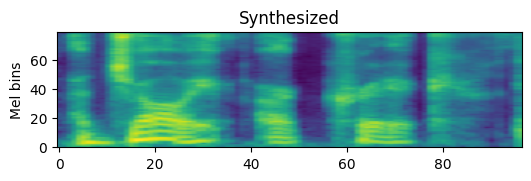

Фонемы: DH_EH_R_ _IH_Z_ _AH_ _HH_EH_L_TH_IY_ _B_AE_NG_K_-_HH_AA_L_AH_D_EY_ _AE_T_M_AH_S_F_IH_R_ _AH_B_AW_T_ _DH_IH_S_ _B_UH_K_ _HH_W_IH_CH_ _IH_Z_ _IH_K_S_T_R_IY_M_L_IY_ _P_L_EH_Z_AH_N_T_.
Ground truth


Synthesized


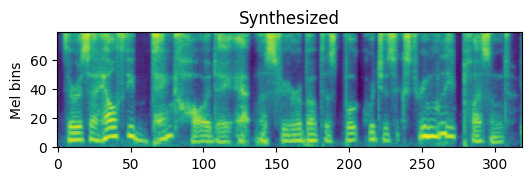

Фонемы: M_IH_S_T_ER_._K_W_IH_L_T_ER_ _IH_Z_ _IH_N_T_AY_ER_L_IY_ _F_R_IY_ _F_R_AH_M_ _AE_F_EH_K_T_EY_SH_AH_N_ _AH_V_ _EH_N_IY_ _K_AY_N_D_.
Ground truth


Synthesized


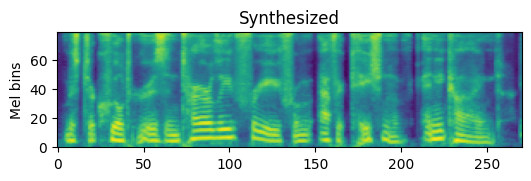

Фонемы: HH_IY_ _R_AA_L_IH_K_S_ _TH_R_UW_ _AA_R_T_ _W_IH_DH_ _DH_AH_ _R_EH_K_L_AH_S_N_AH_S_ _AH_V_ _DH_AH_ _T_UH_R_AH_S_T_ _AE_N_D_ _D_IH_S_K_R_AY_B_Z_ _IH_T_S_ _B_Y_UW_T_IY_Z_ _W_IH_DH_ _DH_AH_ _IH_N_TH_UW_Z_IY_AE_Z_AH_M_ _AH_V_ _DH_AH_ _AA_K_SH_AH_N_IH_R_.
Ground truth


Synthesized


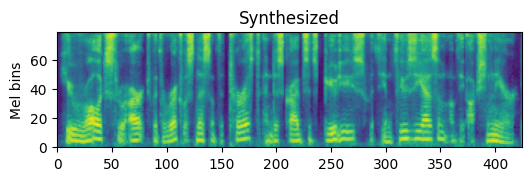

Фонемы: T_AH_ _M_EH_N_IY_,_N_OW_ _D_AW_T_,_HH_IY_ _W_AH_L_ _S_IY_M_ _T_AH_ _B_IY_ _S_AH_M_HH_W_AH_T_ _B_L_EY_T_AH_N_T_ _AE_N_D_ _B_AH_M_P_SH_AH_S_,_B_AH_T_ _W_IY_ _P_R_AH_F_ER_ _T_AH_ _R_AH_G_AA_R_D_ _HH_IH_M_ _AE_Z_ _B_IY_IH_NG_ _S_IH_M_P_L_IY_ _B_R_IH_T_IH_SH_.
Ground truth


Synthesized


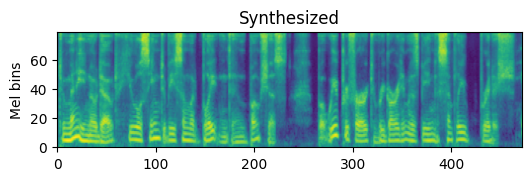

In [17]:
infer_teacher_forcing(
    model, dataset=infer_dataset, codec_model=codec_model, n_samples=5
)

### 1. Sampling functions [2 points]
During inference our model predict logits, and we need to sample from these logits to get the next token. We will use several functions to do that.
- `ArgmaxSampling` - dedicated for greedy decoding, it returns the token with the highest logit (aka probability).
- `MultinomialSampling` - samples indices of codecs from multinomial distribution with probabilities `softmax (logits / temperature)`.
- `TopKSampling` - takes only tok-k logits with highest probabilities and samples from them, using multinomial sampling. 

Each function gets FloatTensor of size [\*, logits], and returns LongTensor of size [\*], where \* - is the arbitrary number of dimensions.

These function from torch can be useful:
- [torch.multinomial](https://pytorch.org/docs/stable/generated/torch.multinomial.html)
- [torch.topk](https://pytorch.org/docs/stable/generated/torch.topk.html)
- [torch.gather](https://pytorch.org/docs/stable/generated/torch.gather.html#torch.gather)

In [18]:
# TODO: implement the following functions


class ArgmaxSampling:
    def __init__(self):
        pass

    def __call__(self, logits):
        return torch.argmax(logits, dim=-1)


class MultinomialSampling:
    def __init__(self, temperature=1.0):
        self.temperature = temperature

    def __call__(self, logits):
        # Your code here

        # logits: [..., vocab_size]
        probs = torch.softmax(logits / self.temperature, dim=-1)

        data_shape = probs.shape[:-1]
        vocab_size = probs.shape[-1]

        probs = probs.reshape(-1, vocab_size)

        samples = torch.multinomial(probs, num_samples=1)

        return samples.reshape(data_shape)


class TopKSampling:
    def __init__(self, k, temperature=1.0):
        self.k = k
        self.temperature = temperature

    def __call__(self, logits):
        # Your code here

        topk_logits, topk_indices = torch.topk(logits, k=self.k, dim=-1)

        probs = torch.softmax(topk_logits / self.temperature, dim=-1)

        # Семплируем
        data_shape = probs.shape[:-1]
        probs = probs.reshape(-1, self.k)
        samples = torch.multinomial(probs, num_samples=1)

        # индексы
        topk_indices_flat = topk_indices.reshape(-1, self.k)
        result = topk_indices_flat.gather(1, samples)

        return result.reshape(data_shape)
        # ^^^^^^^^^^^^^^

Фонемы: AH_ _JH_AA_L_IY_ _AA_R_T_ _K_R_IH_T_IH_K
Ground truth


Synthesized


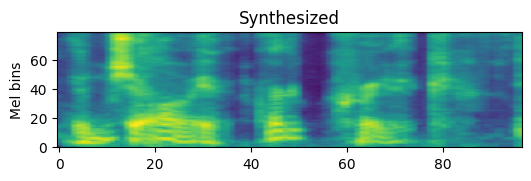

Фонемы: AH_ _JH_AA_L_IY_ _AA_R_T_ _K_R_IH_T_IH_K
Ground truth


Synthesized


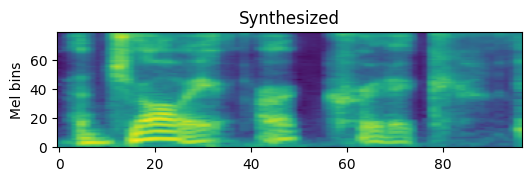

In [19]:
infer_teacher_forcing(
    model,
    dataset=infer_dataset,
    codec_model=codec_model,
    n_samples=1,
    sampling_fn=MultinomialSampling(temperature=1.0),
)

infer_teacher_forcing(
    model,
    dataset=infer_dataset,
    codec_model=codec_model,
    n_samples=1,
    sampling_fn=TopKSampling(k=3, temperature=1.0),
)

Let's listen what we've got and how hyperparameters influence the sampling. 

======== Sampling function: ArgmaxSampling with kwargs {} ========
Фонемы: AH_ _JH_AA_L_IY_ _AA_R_T_ _K_R_IH_T_IH_K
Ground truth


Synthesized


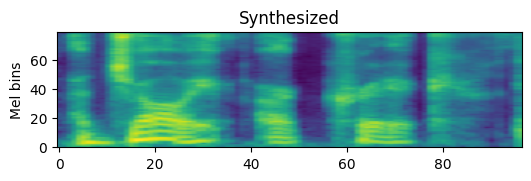

Фонемы: DH_EH_R_ _IH_Z_ _AH_ _HH_EH_L_TH_IY_ _B_AE_NG_K_-_HH_AA_L_AH_D_EY_ _AE_T_M_AH_S_F_IH_R_ _AH_B_AW_T_ _DH_IH_S_ _B_UH_K_ _HH_W_IH_CH_ _IH_Z_ _IH_K_S_T_R_IY_M_L_IY_ _P_L_EH_Z_AH_N_T_.
Ground truth


Synthesized


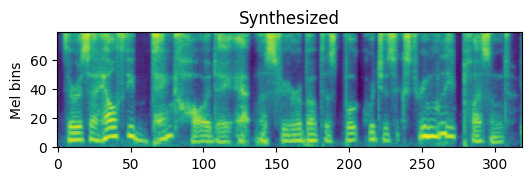

======== Sampling function: MultinomialSampling with kwargs {'temperature': 1.0} ========
Фонемы: AH_ _JH_AA_L_IY_ _AA_R_T_ _K_R_IH_T_IH_K
Ground truth


Synthesized


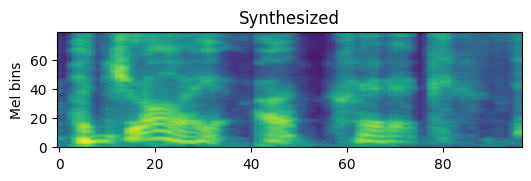

Фонемы: DH_EH_R_ _IH_Z_ _AH_ _HH_EH_L_TH_IY_ _B_AE_NG_K_-_HH_AA_L_AH_D_EY_ _AE_T_M_AH_S_F_IH_R_ _AH_B_AW_T_ _DH_IH_S_ _B_UH_K_ _HH_W_IH_CH_ _IH_Z_ _IH_K_S_T_R_IY_M_L_IY_ _P_L_EH_Z_AH_N_T_.
Ground truth


Synthesized


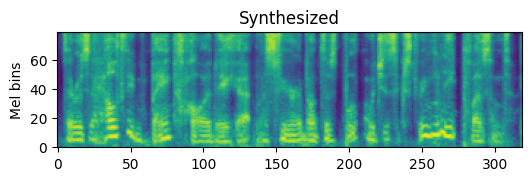

======== Sampling function: MultinomialSampling with kwargs {'temperature': 3.0} ========
Фонемы: AH_ _JH_AA_L_IY_ _AA_R_T_ _K_R_IH_T_IH_K
Ground truth


Synthesized


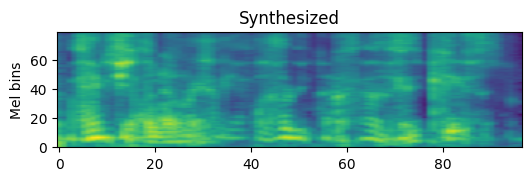

Фонемы: DH_EH_R_ _IH_Z_ _AH_ _HH_EH_L_TH_IY_ _B_AE_NG_K_-_HH_AA_L_AH_D_EY_ _AE_T_M_AH_S_F_IH_R_ _AH_B_AW_T_ _DH_IH_S_ _B_UH_K_ _HH_W_IH_CH_ _IH_Z_ _IH_K_S_T_R_IY_M_L_IY_ _P_L_EH_Z_AH_N_T_.
Ground truth


Synthesized


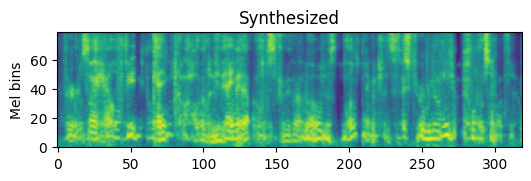

======== Sampling function: MultinomialSampling with kwargs {'temperature': 0.5} ========
Фонемы: AH_ _JH_AA_L_IY_ _AA_R_T_ _K_R_IH_T_IH_K
Ground truth


Synthesized


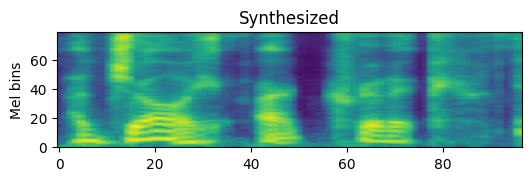

Фонемы: DH_EH_R_ _IH_Z_ _AH_ _HH_EH_L_TH_IY_ _B_AE_NG_K_-_HH_AA_L_AH_D_EY_ _AE_T_M_AH_S_F_IH_R_ _AH_B_AW_T_ _DH_IH_S_ _B_UH_K_ _HH_W_IH_CH_ _IH_Z_ _IH_K_S_T_R_IY_M_L_IY_ _P_L_EH_Z_AH_N_T_.
Ground truth


Synthesized


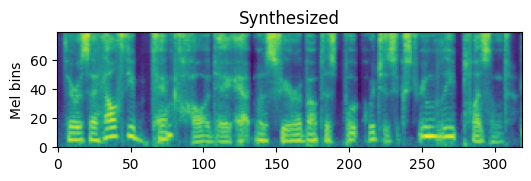

======== Sampling function: TopKSampling with kwargs {'k': 7, 'temperature': 1.0} ========
Фонемы: AH_ _JH_AA_L_IY_ _AA_R_T_ _K_R_IH_T_IH_K
Ground truth


Synthesized


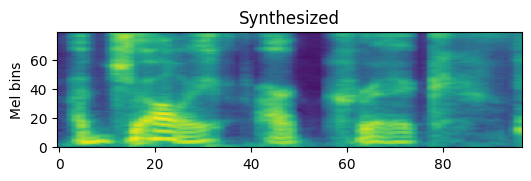

Фонемы: DH_EH_R_ _IH_Z_ _AH_ _HH_EH_L_TH_IY_ _B_AE_NG_K_-_HH_AA_L_AH_D_EY_ _AE_T_M_AH_S_F_IH_R_ _AH_B_AW_T_ _DH_IH_S_ _B_UH_K_ _HH_W_IH_CH_ _IH_Z_ _IH_K_S_T_R_IY_M_L_IY_ _P_L_EH_Z_AH_N_T_.
Ground truth


Synthesized


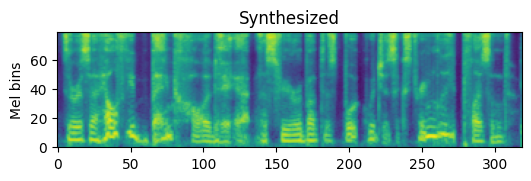

======== Sampling function: TopKSampling with kwargs {'k': 20, 'temperature': 1.0} ========
Фонемы: AH_ _JH_AA_L_IY_ _AA_R_T_ _K_R_IH_T_IH_K
Ground truth


Synthesized


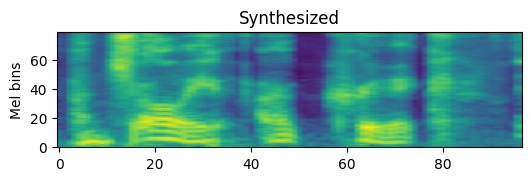

Фонемы: DH_EH_R_ _IH_Z_ _AH_ _HH_EH_L_TH_IY_ _B_AE_NG_K_-_HH_AA_L_AH_D_EY_ _AE_T_M_AH_S_F_IH_R_ _AH_B_AW_T_ _DH_IH_S_ _B_UH_K_ _HH_W_IH_CH_ _IH_Z_ _IH_K_S_T_R_IY_M_L_IY_ _P_L_EH_Z_AH_N_T_.
Ground truth


Synthesized


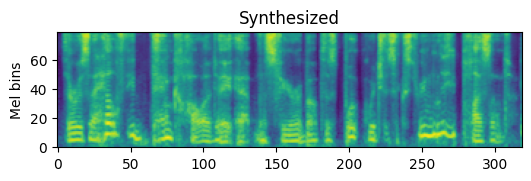

======== Sampling function: TopKSampling with kwargs {'k': 3, 'temperature': 1.0} ========
Фонемы: AH_ _JH_AA_L_IY_ _AA_R_T_ _K_R_IH_T_IH_K
Ground truth


Synthesized


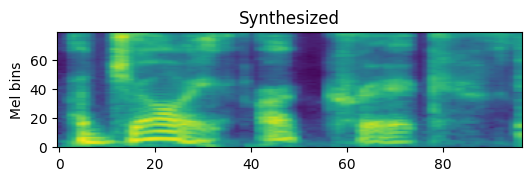

Фонемы: DH_EH_R_ _IH_Z_ _AH_ _HH_EH_L_TH_IY_ _B_AE_NG_K_-_HH_AA_L_AH_D_EY_ _AE_T_M_AH_S_F_IH_R_ _AH_B_AW_T_ _DH_IH_S_ _B_UH_K_ _HH_W_IH_CH_ _IH_Z_ _IH_K_S_T_R_IY_M_L_IY_ _P_L_EH_Z_AH_N_T_.
Ground truth


Synthesized


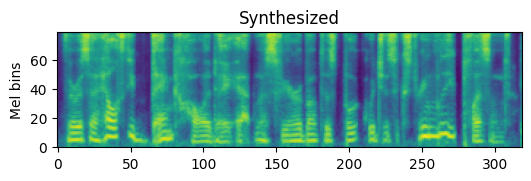

In [20]:
sampling_functions_to_test = [
    (ArgmaxSampling, {}),
    (MultinomialSampling, {"temperature": 1.0}),
    (MultinomialSampling, {"temperature": 3.0}),
    (MultinomialSampling, {"temperature": 0.5}),
    (TopKSampling, {"k": 7, "temperature": 1.0}),
    (TopKSampling, {"k": 20, "temperature": 1.0}),
    (TopKSampling, {"k": 3, "temperature": 1.0}),
]

for sampling_class, sampling_kwargs in sampling_functions_to_test:
    sampling_fn = sampling_class(**sampling_kwargs)
    print(
        f"======== Sampling function: {sampling_class.__name__} with kwargs {sampling_kwargs} ========"
    )
    infer_teacher_forcing(
        model,
        dataset=infer_dataset,
        codec_model=codec_model,
        n_samples=2,
        sampling_fn=sampling_fn,
    )

Assignment:

What are your notions about these different sampling methods ? What is the difference between them ? What are the advantages and disadvantages of each ? Which is the preferable one ?


//TODO

**Субъективные оценки**

На мое ухо качество по 10-бальной шкале:


Argmax: 7

Multinomial t=3: 3

Multinomial t=1: 5

Multinomial t=0.5: 6

TopKSampling k =7: 8

TopKSampling k =20: 6

TopKSampling k =3: 9

**Выводы**

Большая температура в Multinomial ожиджаемо повышает квакание.
Вот почему TopKSampling k=3 звучит чуть лучше ArgMax -загадка. Видимо использование небольших неоптимальностей добавляет голосу "человечинки". Но использование заметных неоптимальностей при k=20 уже начинает портить.



### 2. Autoregressive inference [8 points]

Autoregressive sampling function. It creates, exactly the same, as `infer_teacher_forcing`, but uses `model.autoregressive_sampling` instead of `model.forward`.

In [21]:
def infer_autoregressive(
    model, dataset, codec_model, n_samples=5, sampling_fn=lambda x: x.argmax(dim=-1)
):
    device = model.parameters().__next__().device
    torch.cuda.empty_cache()

    for idx, (phonemes, phoneme_ids, codecs, bioemb) in zip(range(n_samples), dataset):
        phoneme_ids = torch.tensor([phoneme_ids], device=device)
        codecs = torch.tensor([codecs], device=device)
        bioemb = torch.tensor([bioemb], device=device)

        # This function is not supposed to use codecs for prediction
        pred_labels = model.autoregressive_sampling(
            phones=phoneme_ids,
            speaker_embs=bioemb,
            sampling_fn=sampling_fn,
        )

        # [:, 1:, :] is needed to remove the start tokens
        gt_wav = codec_model.decode(codecs[:, 1:, :], bioemb)

        # Clamp is needed to remove the eos, bos or padding token if they emerge in the prediction
        pred_labels = pred_labels.clamp(min=0, max=159)
        synthesized_wav = codec_model.decode(pred_labels, bioemb)

        print(f"Phonemes: {'_'.join(phonemes)}")
        print(f"Ground truth")
        display(Audio(gt_wav, rate=16000))
        print(f"Synthesized")
        display(Audio(synthesized_wav, rate=16000))

        import soundfile as sf

        if hasattr(sampling_fn, "name"):
            sampler_name = sampling_fn.name
        elif hasattr(sampling_fn, "__name__"):
            sampler_name = sampling_fn.__name__
        else:
            sampler_name = type(sampling_fn).__name__

        synthesized_wav = np.asarray(synthesized_wav).squeeze().astype(np.float32)

        # if np.isnan(synthesized_wav).any() or np.isinf(synthesized_wav).any():
        # print("nan")
        # synthesized_wav = np.nan_to_num(synthesized_wav)

        output_filename = f"autoreg_synt_{sampler_name}_{idx}.wav"
        sf.write(output_filename, synthesized_wav, 16000)
        # print(f"Сохранено: {output_filename}")

Assignment:

Go to the file model.py and implement SubDecoder.autoregressive_sampling and TTSTranformer.autoregressive_sampling methods.

Notes:
- The model is allmost exact copy of MQTTS model from the lecture. Except that it doesn't use trick with a window in encoder-decoder attention during inference. 
- You better not modify the `__init__` and `forward` methods of each model. Because the behaviour of the model can change.
- During autoregressive sampling, the model should not use the ground truth codec sequence. Instead, the model should generate the target sequence one token at a time. Starting with a vector of 4 start_tokens.
- You will need to figure out how the model works, so don't hesitate to print the shapes of the tensors you are working with.
- You will need to use SubDecoder.forward and TTSTransformer.forward methods multiple times. But do not modify them.
- The synthesis has two conditions that end the generation of the target sequence:
    - The target sequence is longer than the maximum length.
    - The target sequence contains at least one end token.

In [23]:
# infer_autoregressive(model, dataset=infer_dataset, codec_model=codec_model, sampling_fn=MultinomialSampling())
# infer_autoregressive(model, dataset=infer_dataset, codec_model=codec_model, n_samples=5, sampling_fn=MultinomialSampling(temperature=0.6))

# infer_autoregressive(model, dataset=infer_dataset, codec_model=codec_model, n_samples=5, sampling_fn=TopKSampling(k=3, temperature=0.2))
# infer_autoregressive(model, dataset=infer_dataset, codec_model=codec_model, n_samples=5, sampling_fn=ArgmaxSampling())
# infer_autoregressive(model, dataset=infer_dataset, codec_model=codec_model, n_samples=5, sampling_fn=TopKSampling(k=20, temperature=1.95))
infer_autoregressive(
    model,
    dataset=infer_dataset,
    codec_model=codec_model,
    n_samples=5,
    sampling_fn=TopKSampling(k=7, temperature=0.8),
)

Phonemes: AH_ _JH_AA_L_IY_ _AA_R_T_ _K_R_IH_T_IH_K
Ground truth


Synthesized


Phonemes: DH_EH_R_ _IH_Z_ _AH_ _HH_EH_L_TH_IY_ _B_AE_NG_K_-_HH_AA_L_AH_D_EY_ _AE_T_M_AH_S_F_IH_R_ _AH_B_AW_T_ _DH_IH_S_ _B_UH_K_ _HH_W_IH_CH_ _IH_Z_ _IH_K_S_T_R_IY_M_L_IY_ _P_L_EH_Z_AH_N_T_.
Ground truth


Synthesized


Phonemes: M_IH_S_T_ER_._K_W_IH_L_T_ER_ _IH_Z_ _IH_N_T_AY_ER_L_IY_ _F_R_IY_ _F_R_AH_M_ _AE_F_EH_K_T_EY_SH_AH_N_ _AH_V_ _EH_N_IY_ _K_AY_N_D_.
Ground truth


Synthesized


Phonemes: HH_IY_ _R_AA_L_IH_K_S_ _TH_R_UW_ _AA_R_T_ _W_IH_DH_ _DH_AH_ _R_EH_K_L_AH_S_N_AH_S_ _AH_V_ _DH_AH_ _T_UH_R_AH_S_T_ _AE_N_D_ _D_IH_S_K_R_AY_B_Z_ _IH_T_S_ _B_Y_UW_T_IY_Z_ _W_IH_DH_ _DH_AH_ _IH_N_TH_UW_Z_IY_AE_Z_AH_M_ _AH_V_ _DH_AH_ _AA_K_SH_AH_N_IH_R_.
Ground truth


Synthesized


Phonemes: T_AH_ _M_EH_N_IY_,_N_OW_ _D_AW_T_,_HH_IY_ _W_AH_L_ _S_IY_M_ _T_AH_ _B_IY_ _S_AH_M_HH_W_AH_T_ _B_L_EY_T_AH_N_T_ _AE_N_D_ _B_AH_M_P_SH_AH_S_,_B_AH_T_ _W_IY_ _P_R_AH_F_ER_ _T_AH_ _R_AH_G_AA_R_D_ _HH_IH_M_ _AE_Z_ _B_IY_IH_NG_ _S_IH_M_P_L_IY_ _B_R_IH_T_IH_SH_.
Ground truth


Synthesized


Let's say, that you have implemented those methods successefully if the model 
geneates comprehensible speech.

Now you can play with different types and hyperparameters of sampling in autoregressive synthesis.

Write down:
- What hyperparameters you have played with ?
- Compare them.
- How do they influece autoregressive synthesis ?
- What is their effect on audio-quality, intonation and speaker-similarity ? 
- What are the optimal hyperparameters ?

//TODO:

**Выводы**

В основном пробовал разные методы семплирования с разнымии параметрами температуры. 
При понижении температуры (или уменьшении числа вариантов topK) модель делает более "роботизированный" звук. В пределе сваливается вообще в 
зуммер или шелест.
При повышении температуры растет вариабельность прочтения - становятся менее академическими паузы, гуляют интонации, появляются проглочненные звуки, порой шамканье в голосе.

На мое ухо TopKSampling(k=7, temperature=0.8)  звучит нормально.

Пробовал еще придавать индивидуальные температуры кодебукам, но особой разницы не заметил. 

 

### Rules for commiting homework

- Clear your code from debugging `print`-s
- You need to commit 2 files: `model.py` and `homework.ipynb` and some samples with your synthesis
- The resulted notebook includes some audios and weights a lot of memory. YOu can use this tutorial to share the notebook: https://gist.github.com/yashika51/58d2b6d8d1048a1d0a9ea5949a8aa7f6 . Or you can also try using collab.